In [1]:
import os
import pandas as pd
import numpy as np
import shutil
import random

#Import Libraries for image processing and visualization
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageEnhance, ImageFilter, ImageStat
from IPython.display import display

# Import Tensorflow and Keras for deep learning
import tensorflow as tf
from tensorflow.keras.preprocessing import image as tf_image
from tensorflow.keras import layers, models, applications
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, LSTM
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Import Scickit-Learn for machine learning models and evaluation
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils import shuffle
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Import tqdm fro progress bar visualization
from tqdm import tqdm

In [2]:
# Download latest version
base_folder = r"C:\Users\wael.alaswad\PycharmProjects\DeepLearning\Detect_fatigue\Dataset\Data"

print("base_folder to dataset files:", base_folder)

# Prepare a list to store image data and labels
data =[]

base_folder to dataset files: C:\Users\wael.alaswad\PycharmProjects\DeepLearning\Detect_fatigue\Dataset\Data


In [3]:
# Load images and corresponding labels
for status_folder in os.listdir(base_folder):
  status_path = os.path.join(base_folder, status_folder)
  if os.path.isdir(status_path):
    for img_file in os.listdir(status_path):
      img_path = os.path.join(status_path, img_file)
      if img_file.lower().endswith((".png", ".jpg", 'jpeg', '.tiff', '.bmp', '.gif')):

        try:
          img = Image.open(img_path).convert('RGB').resize((224,224))
          data.append({'image': img, 'label': status_folder})

        except Exception as e:
          print(f'Error Loading Image {img_file}: {e}')


df = pd.DataFrame(data)
df

,image,label
0,<PIL.Image.Image image mode=RGB size=224x224 a...,Fatigue
1,<PIL.Image.Image image mode=RGB size=224x224 a...,Fatigue
2,<PIL.Image.Image image mode=RGB size=224x224 a...,Fatigue
3,<PIL.Image.Image image mode=RGB size=224x224 a...,Fatigue
4,<PIL.Image.Image image mode=RGB size=224x224 a...,Fatigue
...,...,...
2195,<PIL.Image.Image image mode=RGB size=224x224 a...,NonFatigue
2196,<PIL.Image.Image image mode=RGB size=224x224 a...,NonFatigue
2197,<PIL.Image.Image image mode=RGB size=224x224 a...,NonFatigue
2198,<PIL.Image.Image image mode=RGB size=224x224 a...,NonFatigue


Image Number 0, at Index 1668
Image Number 1, at Index 2127
Image Number 2, at Index 504
Image Number 3, at Index 815
Image Number 4, at Index 1448
Image Number 5, at Index 13
Image Number 6, at Index 1906
Image Number 7, at Index 553
Image Number 8, at Index 1439
Image Number 9, at Index 745
Image Number 10, at Index 2053
Image Number 11, at Index 1099
Image Number 12, at Index 1801
Image Number 13, at Index 1799
Image Number 14, at Index 809
Image Number 15, at Index 1891
Image Number 16, at Index 725
Image Number 17, at Index 1476
Image Number 18, at Index 576
Image Number 19, at Index 1166
Image Number 20, at Index 1891
Image Number 21, at Index 1989
Image Number 22, at Index 669
Image Number 23, at Index 1762
Image Number 24, at Index 1085
Image Number 25, at Index 1857
Image Number 26, at Index 2156
Image Number 27, at Index 1345
Image Number 28, at Index 1886
Image Number 29, at Index 288
Image Number 30, at Index 483
Image Number 31, at Index 108
Image Number 32, at Index 622
I

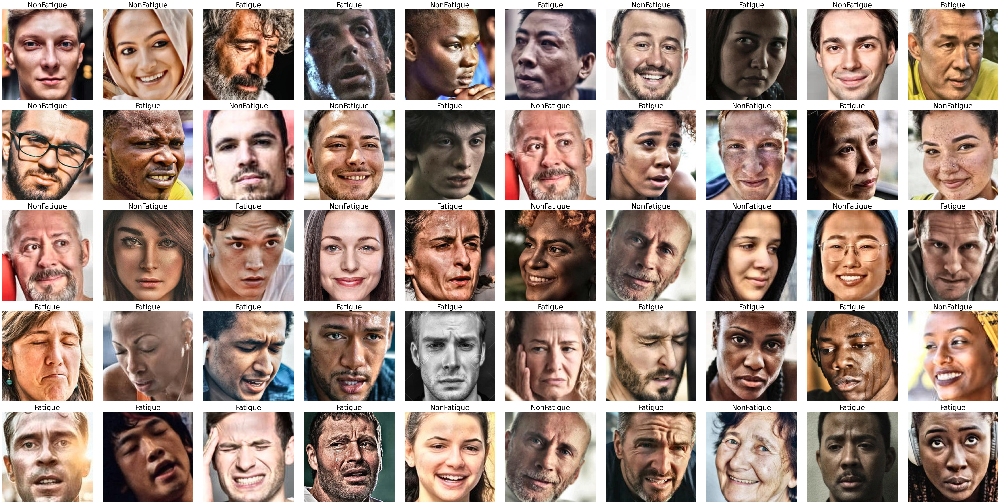

In [4]:
plt.figure(figsize = (50,50))

# Loop Over to get 50 sample
for n, i in enumerate(np.random.randint(0, len(df), 50)):
  print(f'Image Number {n}, at Index {i}')
  #create subplot
  plt.subplot(10, 10, n+1)
  img = df.iloc[i]["image"]

  img_resized = img.resize((224, 224))
  plt.imshow(img_resized)
  plt.axis("off")

  plt.title(df.iloc[i]['label'],fontsize=25 )

plt.tight_layout()

plt.show()



In [5]:
images = np.array([np.array(img) for img in df['image']])

labels = df['label'].values

# Label Encoder
LE = LabelEncoder()
labels_encoded = LE.fit_transform(labels)

# One Hot Encoder
labels_one_hot = to_categorical(labels_encoded)

print(labels_encoded)
print(labels_one_hot)

[0 0 0 ... 1 1 1]
[[1. 0.]
 [1. 0.]
 [1. 0.]
 ...
 [0. 1.]
 [0. 1.]
 [0. 1.]]


In [6]:
X_train, X_test, y_train, y_test = train_test_split(images,labels_encoded,test_size=0.2, random_state=42)

X_train_cnn = X_train / 255.0
X_test_cnn = X_test / 255.0

X_train_cnn = X_train_cnn.reshape(-1, 224, 224, 3)
X_test_cnn = X_test_cnn.reshape(-1, 224, 224, 3)
print(f'CNN input image: {X_train_cnn.shape}')
print(f'CNN test image: {X_test_cnn.shape}')

CNN input image: (1760, 224, 224, 3)
CNN test image: (440, 224, 224, 3)


In [8]:
# Build the model
cnnCT = Sequential()

# Block1
# Correct the input_shape to match the actual image size (224, 224, 3)
cnnCT.add(Conv2D(32,(3,3), activation = 'relu', input_shape = (224, 224, 3)))
cnnCT.add(BatchNormalization())
cnnCT.add(MaxPooling2D((2,2)))

# Block2
cnnCT.add(Conv2D(64,(3,3), activation = 'relu'))
cnnCT.add(BatchNormalization())
cnnCT.add(MaxPooling2D((2,2)))

# Block3
cnnCT.add(Conv2D(128,(3,3), activation = 'relu'))
cnnCT.add(BatchNormalization())
cnnCT.add(MaxPooling2D((2,2)))

# Block4
cnnCT.add(Conv2D(256,(3,3), activation = 'relu'))
cnnCT.add(BatchNormalization())
cnnCT.add(MaxPooling2D((2,2)))

# Flatten
cnnCT.add(Flatten())

# Fully Connected
cnnCT.add(Dense(256, activation = 'relu'))
cnnCT.add(Dropout(0.3))
cnnCT.add(Dense(len(LE.classes_), activation = 'softmax'))


cnnCT.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Convert y_train and y_test to one-hot encoding
y_train_one_hot = to_categorical(y_train, num_classes=len(LE.classes_))
y_test_one_hot = to_categorical(y_test, num_classes=len(LE.classes_))

# Callbacks
early_stopping = EarlyStopping(monitor = 'val_loss', patience = 5, restore_best_weights= True)

# Stop training if validation loss stops improving for 5 epochs
# Restores the best weights to avoid overfitting
lr_scheduler = ReduceLROnPlateau(monitor = 'val_loss', factor=0.5, patience = 3, verbose=1)

#train CNN Model
cnnCT.fit(X_train_cnn, y_train_one_hot, validation_split = 0.2, epochs=50, batch_size=32, callbacks= [early_stopping, lr_scheduler])

# Get Weights
cnnCT.get_weights()   # (weights, bias)


# Evaluate CNN model
cnn_test_loss, cnn_test_accuracy = cnnCT.evaluate(X_test_cnn, y_test_one_hot)
print(f'CNN Test Loss: {cnn_test_loss}, CNN Test Accuracy: {cnn_test_accuracy}')

Epoch 1/50


44/44 [==============================] - 79s 2s/step - loss: 3.6650 - accuracy: 0.6783 - val_loss: 2.1992 - val_accuracy: 0.4517 - lr: 0.0010
Epoch 2/50
44/44 [==============================] - 66s 2s/step - loss: 0.6062 - accuracy: 0.7756 - val_loss: 7.0743 - val_accuracy: 0.4489 - lr: 0.0010
Epoch 3/50
44/44 [==============================] - 81s 2s/step - loss: 0.4952 - accuracy: 0.8018 - val_loss: 4.6238 - val_accuracy: 0.4489 - lr: 0.0010
Epoch 4/50
44/44 [==============================] - ETA: 0s - loss: 0.3639 - accuracy: 0.8310
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
44/44 [==============================] - 71s 2s/step - loss: 0.3639 - accuracy: 0.8310 - val_loss: 12.2915 - val_accuracy: 0.4489 - lr: 0.0010
Epoch 5/50
44/44 [==============================] - 62s 1s/step - loss: 0.2975 - accuracy: 0.8857 - val_loss: 4.6481 - val_accuracy: 0.4489 - lr: 5.0000e-04
Epoch 6/50
14/14 [==============================] - 6s 366ms/step - l